In [1]:
%pip install scikit-learn-extra


Note: you may need to restart the kernel to use updated packages.


In [2]:
# Import library
import pandas as pd 
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from matplotlib import colors
import matplotlib.pyplot as plt
%matplotlib inline
from itertools import product
import missingno

# Preprocessing Data
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Modeling
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering, Birch
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Handling Warning
import warnings
warnings.filterwarnings('ignore')


C:\Users\himan\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [3]:
# load dataset
df = pd.read_csv('CC GENERAL.csv')

# We convert name of feature to lower font
df.columns = map(str.lower, df.columns)
df.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


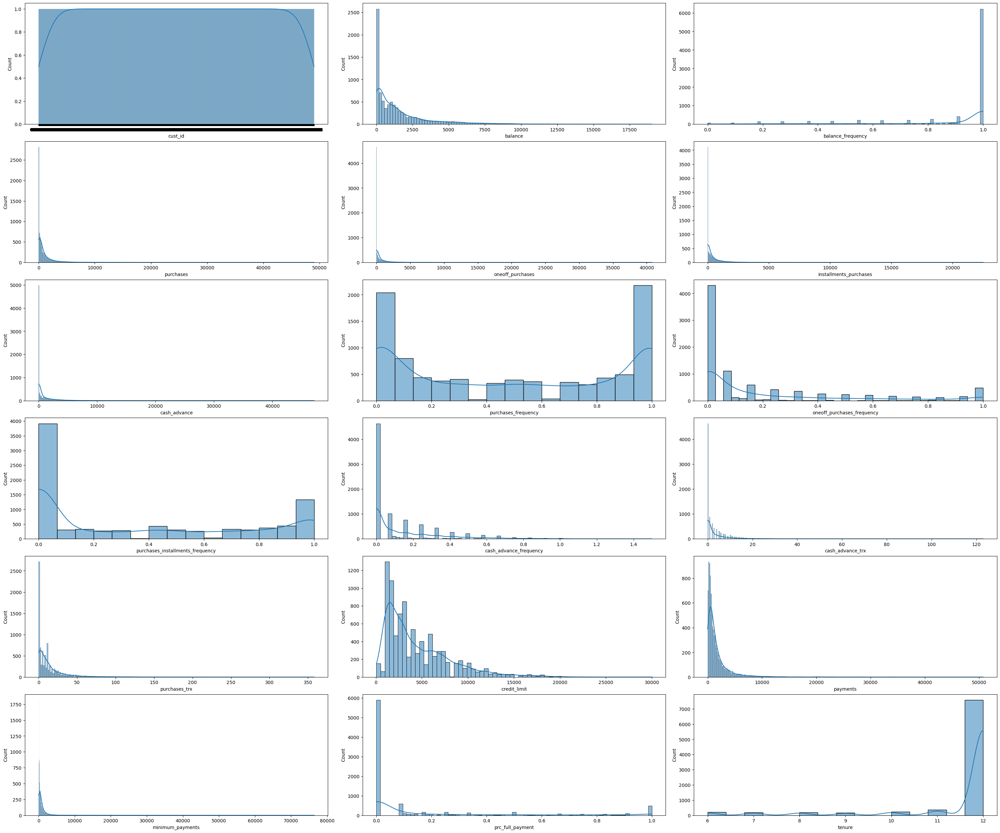

In [4]:
# creating distribution plot for analysis
fig = plt.figure(figsize=(30, 25), constrained_layout=True)
for i in range(len(df.columns)):
    plt.subplot(6, 3, i+1)
    sns.histplot(df[df.columns[i]], kde=True)

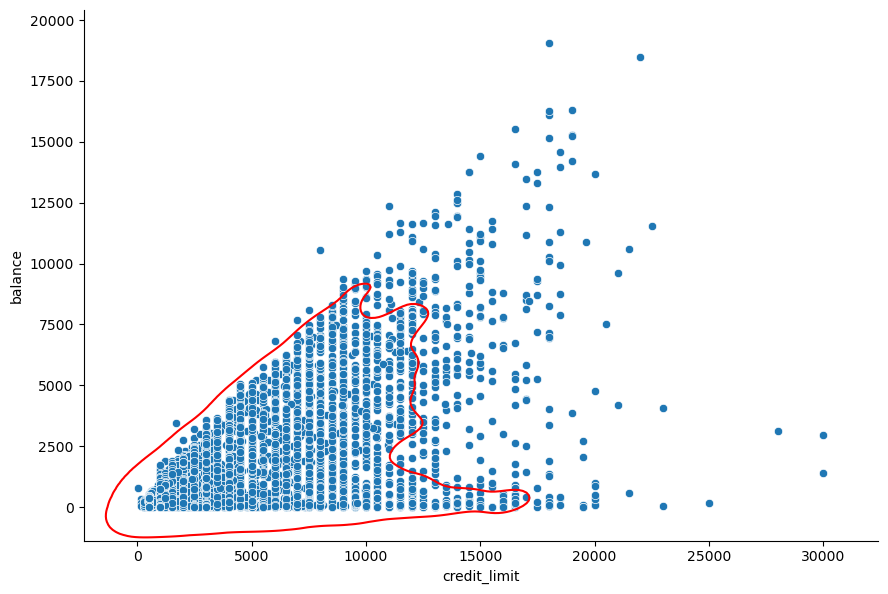

In [5]:
#plot relation credit limit with balance
sns.pairplot(data=df, x_vars='credit_limit', y_vars='balance', 
             height=6, aspect=1.5).map(sns.kdeplot, levels=1, color='red');

## The plot explained that most of user are distributed around Credit Limit below 13.000 and balance Below 8.000.


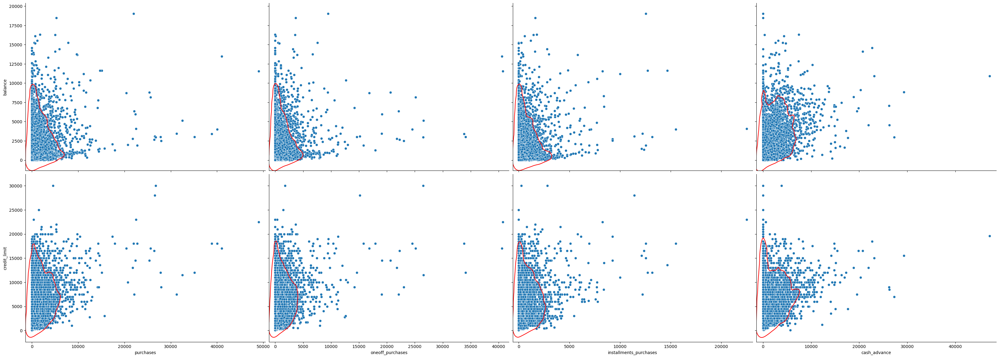

In [6]:
#relation plot between features
sns.pairplot(data=df, 
             y_vars=['balance', 'credit_limit'], 
             x_vars=['purchases', 'oneoff_purchases', 'installments_purchases', 'cash_advance'],
            height=6, aspect=1.4).map(sns.kdeplot, levels=1, color='red');

## The plot above explained that feature like purchases, oneoff_purchases, INSTALLMENT_purchases, and cash_advance are showing trends that similar to credit limit and balance. This due to the balance and credit limit from the users are low, therefore the purchase also low.

In [7]:
#displaying purchase frequency above 0.5
print(len(df[df['purchases_installments_frequency'] > .5]), 'purchases_installments_frequency')
print(len(df[df['oneoff_purchases_frequency'] > .5]), 'oneoff_purchases_frequency')

3090 purchases_installments_frequency
1343 oneoff_purchases_frequency


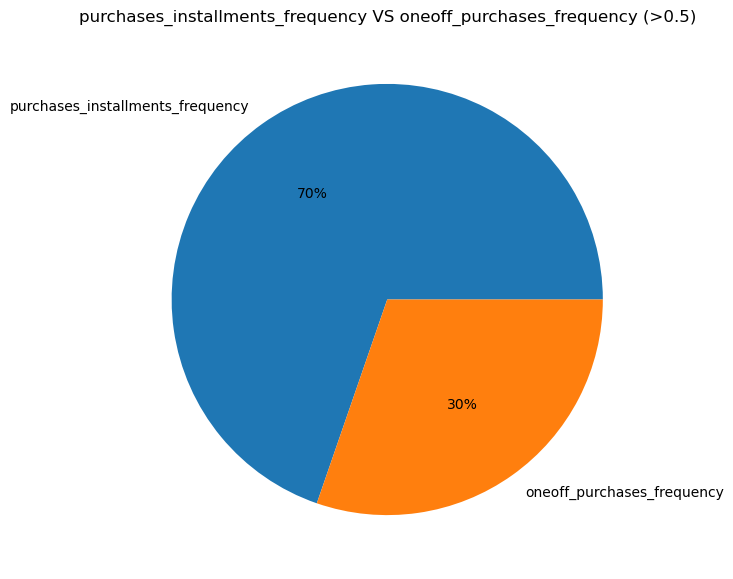

In [8]:
#pie plot for installment vs oneoff
plt.figure(figsize=(7,7))
plt.pie([len(df[df['purchases_installments_frequency'] > .5]),
         len(df[df['oneoff_purchases_frequency'] > .5])], 
        labels = ['purchases_installments_frequency', 
                  'oneoff_purchases_frequency'], 
        autopct='%.0f%%')
plt.title('purchases_installments_frequency VS oneoff_purchases_frequency (>0.5)');

## The plot above explained that most of user made purchase using installment rather than one off payment.

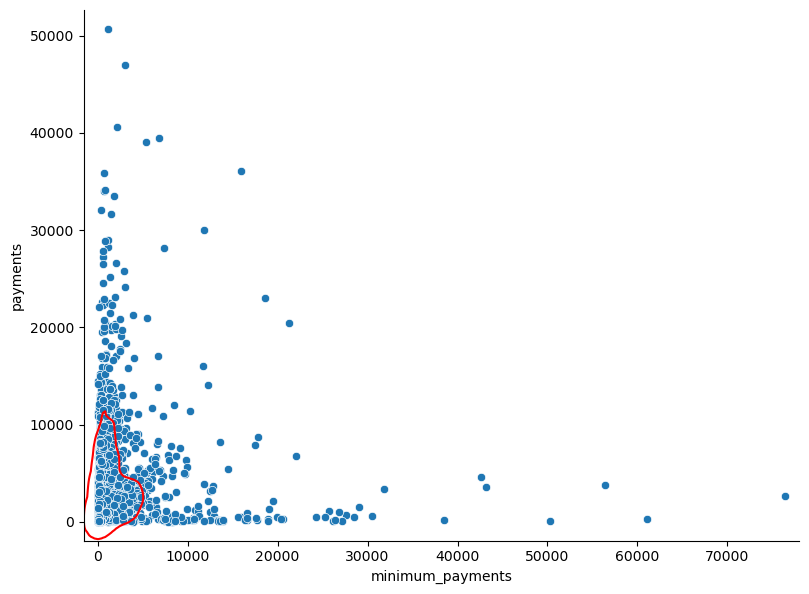

In [9]:
#pair plot for payments vs minimum payments
sns.pairplot(data=df, y_vars='payments', x_vars='minimum_payments', 
             height=6, aspect=1.4).map(sns.kdeplot, levels=1, color='red');

## The plot above explain that in the kde line we can see that the most of users are distributed around had made payment below 12.000 and their minimum payments are below 5.000.


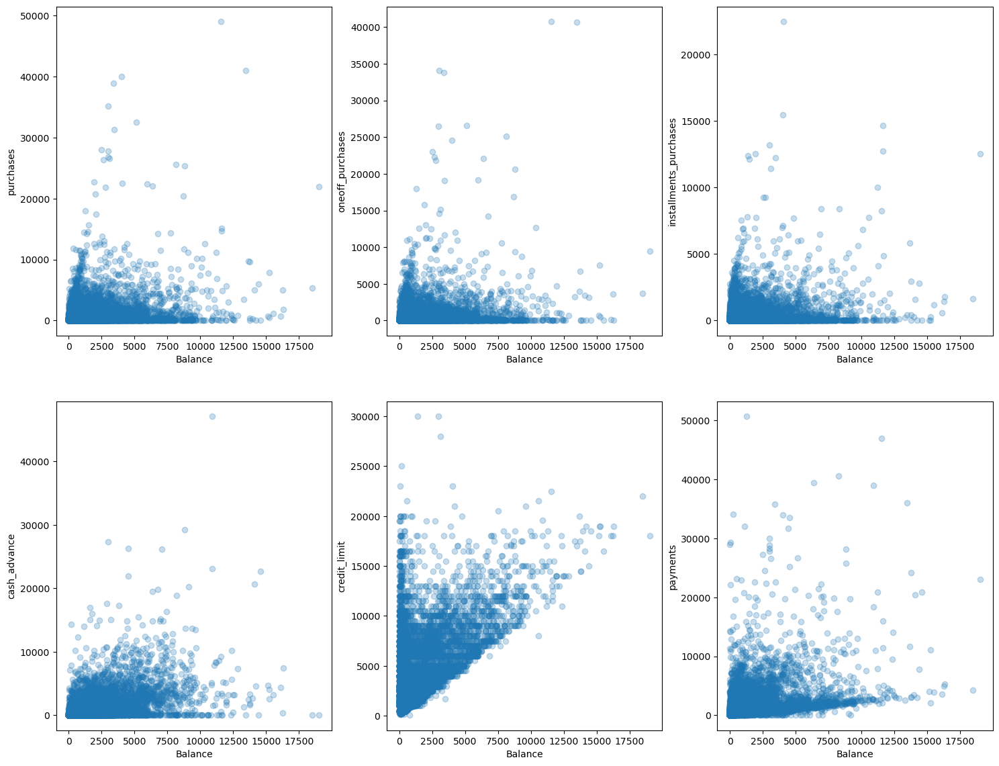

In [10]:
# creating plot analysis
plt.figure(figsize=(18, 14))
columns=['purchases','oneoff_purchases','installments_purchases','cash_advance','credit_limit','payments']
n=1
for x in columns:
    plt.subplot(2,3,n)
    plt.scatter(df['balance'], df[x], alpha=0.25)
    plt.xlabel('Balance')
    plt.ylabel(x)
    n=n+1
plt.ticklabel_format(useOffset=False, style='plain')
plt.show()

# 99% of user have balance below 10.000 and most of them(more than around 80%):

1. Made total purchases up to 10.000
2. Made oneoff purchase up to 5.000
3. Made installment purchases up to 5.000
4. Use cash in advance up to 10.000
5. Have credit_limit up to 15.000
6. Made payment up to 10.000

Analysis:

1. Since most of users have balance up to 10.000 and half of them are paid using oneoff method. Since the customer already have a good spending habits, we should try to think a way to convert this kind of customer to try paid using credit cards.

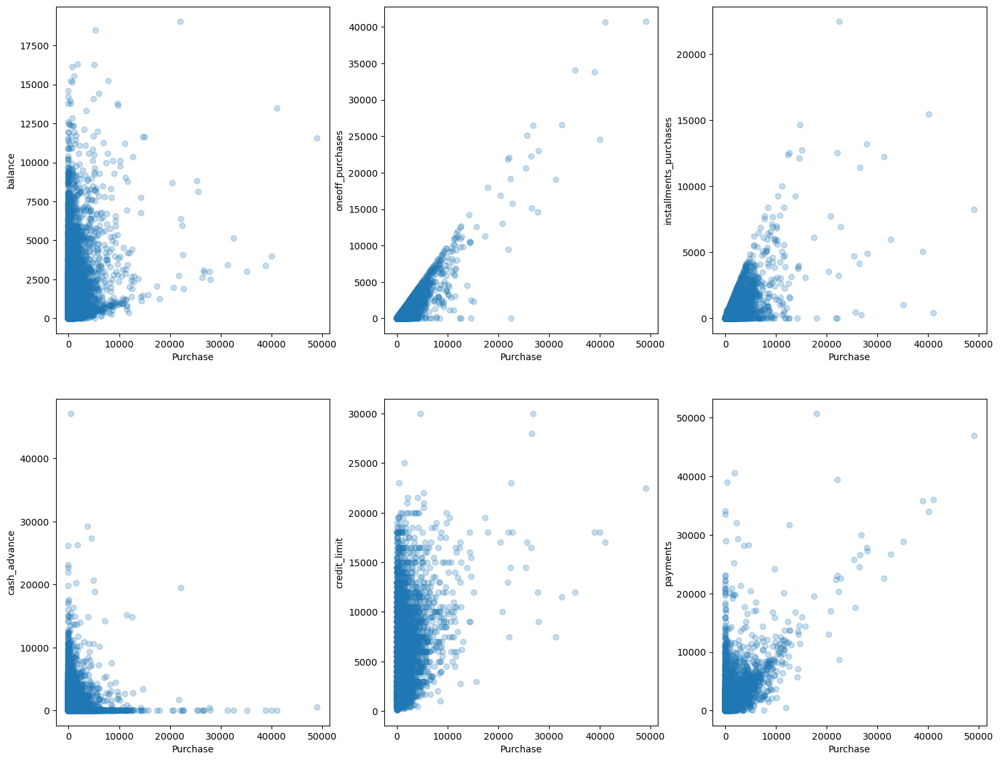

In [11]:
# creating plot analysis
plt.figure(figsize=(18, 14))
columns=['balance','oneoff_purchases','installments_purchases','cash_advance','credit_limit','payments']
n=1
for x in columns:
    plt.subplot(2,3,n)
    plt.scatter(df['purchases'], df[x], alpha=0.25)
    plt.xlabel('Purchase')
    plt.ylabel(x)
    n=n+1
plt.ticklabel_format(useOffset=False, style='plain')
plt.show()

# As observed, 99% customers make purchases up to 10,000 and:

1. Have a balance up to 10.000
2. Made one off purchases up to 10.000
3. Made installment purchases up to 5.000
4. Have credit limit up to 20.000
5. Made payments up to 20.000
6. Use cash in advance up to 10.000

Analysis:

1. Most of user that made purchase up to 10.000 have credit limit up to 20.000. This means the customer still not use the credit card to its fullest. We assume this occured due to whether the credit interest are too high, bank credit card does not support payment to many outlet, most of user credit card is still new, or there are better credit card than this bank.

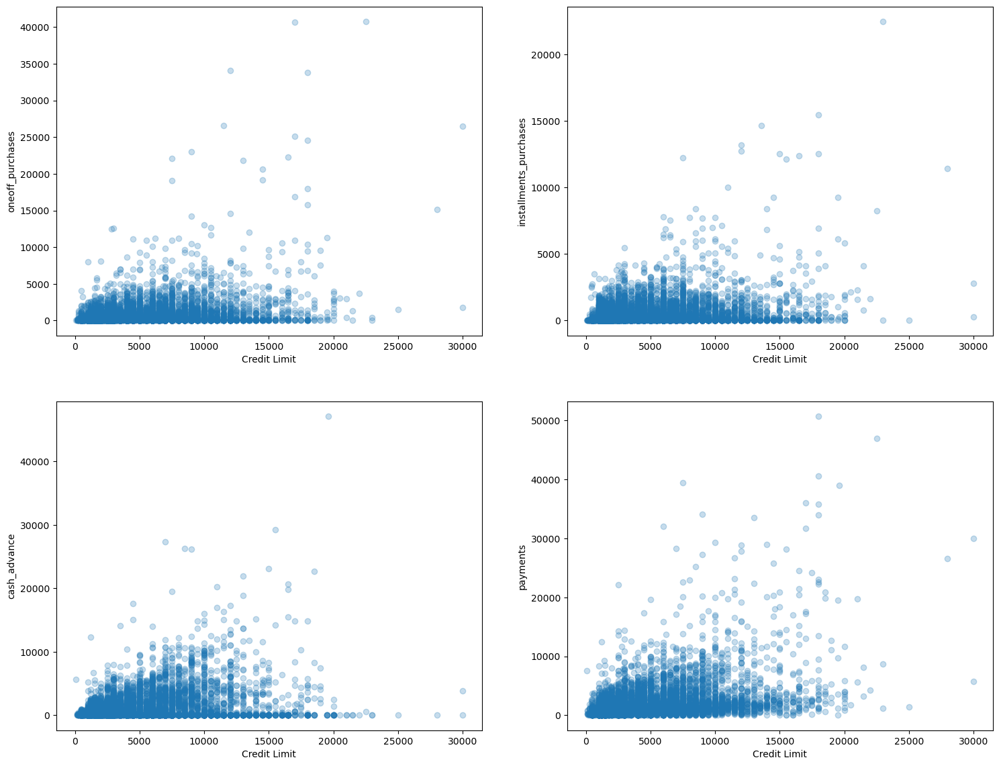

In [12]:
# creating plot
plt.figure(figsize=(18, 14))
columns=['oneoff_purchases','installments_purchases','cash_advance','payments']
n=1
for x in columns:
    plt.subplot(2,2,n)
    plt.scatter(df['credit_limit'], df[x], alpha=0.25)
    plt.xlabel('Credit Limit')
    plt.ylabel(x)
    n=n+1
plt.ticklabel_format(useOffset=False, style='plain')
plt.show()

# 99% customers have credit limit up to 20,000 and:

1. Made one off purchases up to 5.000
2. Made installments purchases up to 5.000
3. Made payments up to 10.000
4. Use cash in advance up to 10.000

Analysis:

1. Most of the customer already have a high credit limit. We assume there are no significant problem in the credit limit rather we should analyze the customer behaviour

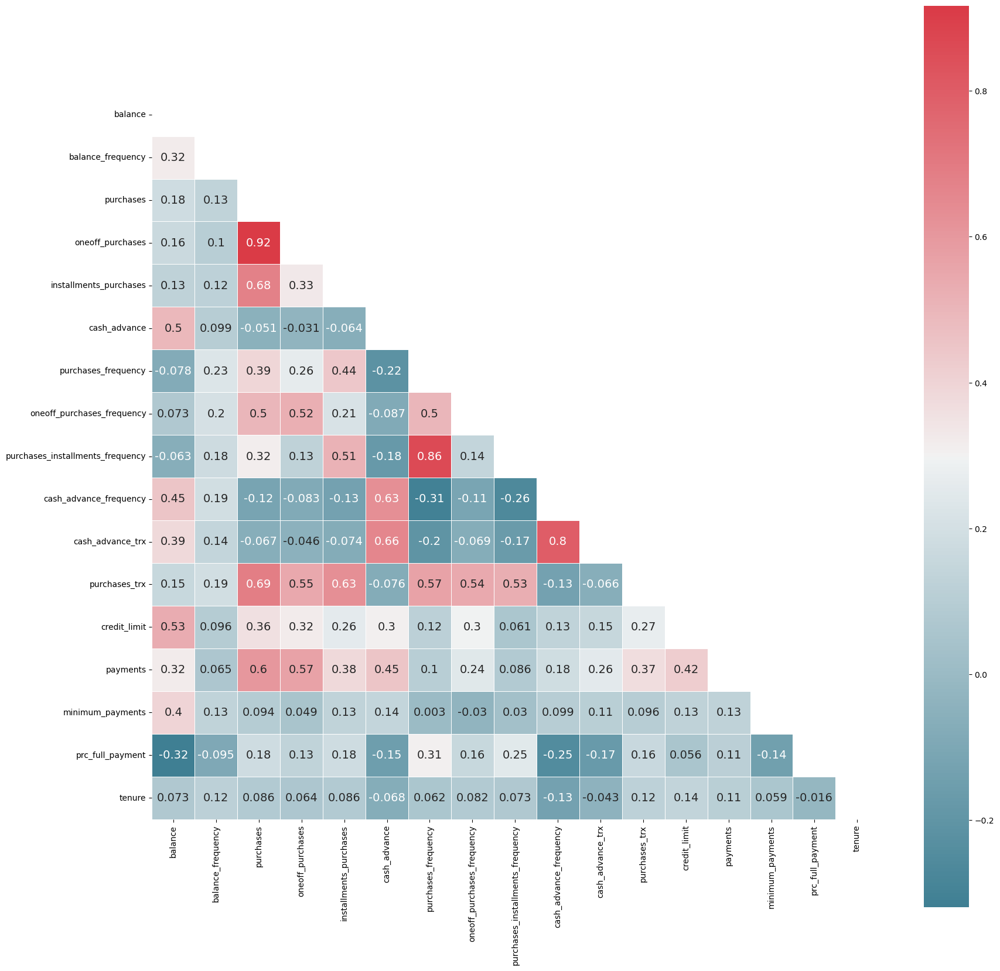

In [13]:
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# calculates the correlations
correlation = numeric_df.corr(method='pearson')

# uses the variable ax for single a Axes
fig, ax = plt.subplots()

# sets the figure size in inches
ax.figure.set_size_inches(20, 20)

# generates a mask for the upper triangle
mask = np.triu(np.ones_like(correlation, dtype=bool))

# generates a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# plots the heatmap
sns.heatmap(correlation, cmap=cmap, mask=mask, square=True, linewidths=.5, 
            annot=True, annot_kws={'size':14})

# displays the plot
plt.show()

# Very strong correlations:

1. One off purchases with purchases. This due to one off purchase are part of the purchase.
purchases installments frequency with purchases frequency. We assume this could indicate payments using installment method happens frequently.

2. Cash in advance transactions with Cash in advance frequency. We assume this could indicate that advance payments happens frequently.

3. Purchases with purchases transactions. We assume this indicate total purchase consist of many purchase transaction.
Medium correlations:

4. Installment purchase with purchases. This due to one off purchase are part of the purchase.
balance with Cash in advance. This due to balance are updated when advance payment occur.
balance with Cash in advance frequency. We assume this due to every advance payment, the balance are also updated.
balance with Credit limit. We assume this due to balance are one of major point bank decide credit limit given to the customer.

In [14]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8950 non-null   object 
 1   balance                           8950 non-null   float64
 2   balance_frequency                 8950 non-null   float64
 3   purchases                         8950 non-null   float64
 4   oneoff_purchases                  8950 non-null   float64
 5   installments_purchases            8950 non-null   float64
 6   cash_advance                      8950 non-null   float64
 7   purchases_frequency               8950 non-null   float64
 8   oneoff_purchases_frequency        8950 non-null   float64
 9   purchases_installments_frequency  8950 non-null   float64
 10  cash_advance_frequency            8950 non-null   float64
 11  cash_advance_trx                  8950 non-null   int64  
 12  purcha

In [15]:
# Check detailed info for each feature
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(), round((df[col].isna().sum()/len(df[col])) * 100,2),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'missing value', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dfDesc

,dataFeatures,dataType,missing value,nullPct,unique,uniqueSample
0,cust_id,object,0,0.00,8950,"[C10719, C11785]"
1,balance,float64,0,0.00,8871,"[1371.015868, 867.244416]"
2,balance_frequency,float64,0,0.00,43,"[0.1, 1.0]"
3,purchases,float64,0,0.00,6203,"[549.96, 367.44]"
4,oneoff_purchases,float64,0,0.00,4014,"[37.65, 35.94]"
5,installments_purchases,float64,0,0.00,4452,"[135.0, 22.99]"
6,cash_advance,float64,0,0.00,4323,"[2692.777044, 1253.401339]"
7,purchases_frequency,float64,0,0.00,47,"[0.1, 0.583333]"
8,oneoff_purchases_frequency,float64,0,0.00,47,"[0.363636, 0.166667]"
9,purchases_installments_frequency,float64,0,0.00,47,"[0.636364, 0.888889]"


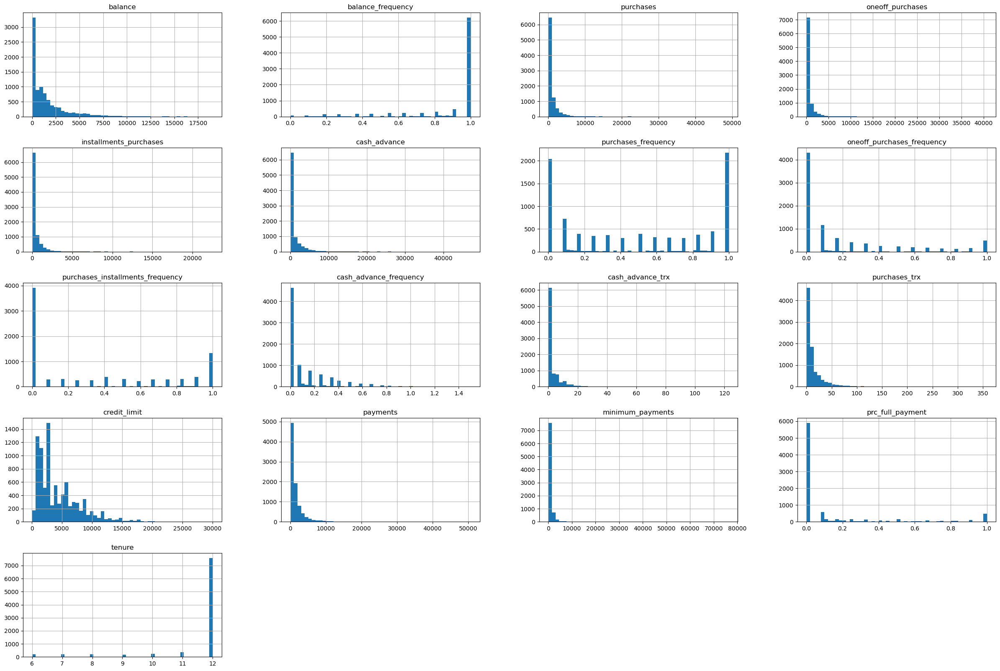

In [16]:
# Distribution plot to visualize data distribution

hist_b_ho = df.hist(bins=50,figsize=(30,20))
hist_b_ho
plt.show()

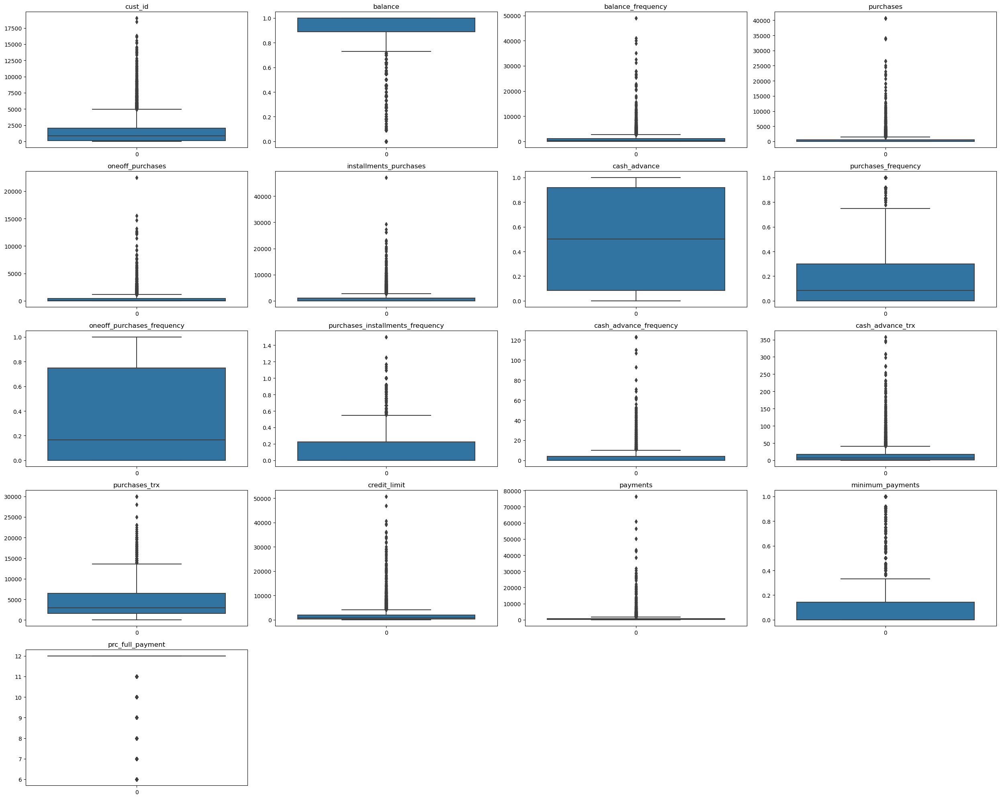

In [17]:
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# plot for outliers detection

plt.figure(figsize=(25,20))
for i in range(len(numeric_df.columns)):
    plt.subplot(5,4,i+1)
    sns.boxplot(numeric_df[numeric_df.columns[i]])
    plt.title(df.columns[i])
    
plt.tight_layout()

In [18]:
# creating function to generate IQR, lower limit, and Upper limit

def find_outlier(df, feature):
    print('Outlier ' + feature)
    q1 = df[feature].quantile(0.25)
    q3 = df[feature].quantile(0.75)
    iqr = q3 - q1
    limit = iqr*1.5
    print(f'IQR: {iqr}')

    Lower_Limit = q1 - limit
    Upper_Limit = q3 + limit
    print(f'Lower_Limit: {Lower_Limit}')
    print(f'Upper_Limit: {Upper_Limit}')
    print('_________________________')

In [19]:
# check IQR, upper limit, and lower limit for each feature
numeric_df = df.select_dtypes(include=['float64', 'int64'])

for i in numeric_df :
    find_outlier(df, i)

Outlier balance
IQR: 1925.85812
Lower_Limit: -2760.5052645
Upper_Limit: 4942.9272155
_________________________
Outlier balance_frequency
IQR: 0.11111099999999996
Lower_Limit: 0.7222225000000001
Upper_Limit: 1.1666664999999998
_________________________
Outlier purchases
IQR: 1070.4950000000001
Lower_Limit: -1566.1075000000003
Upper_Limit: 2715.8725000000004
_________________________
Outlier oneoff_purchases
IQR: 577.405
Lower_Limit: -866.1075
Upper_Limit: 1443.5124999999998
_________________________
Outlier installments_purchases
IQR: 468.6375
Lower_Limit: -702.95625
Upper_Limit: 1171.59375
_________________________
Outlier cash_advance
IQR: 1113.8211392500002
Lower_Limit: -1670.7317088750003
Upper_Limit: 2784.5528481250003
_________________________
Outlier purchases_frequency
IQR: 0.833334
Lower_Limit: -1.166668
Upper_Limit: 2.166668
_________________________
Outlier oneoff_purchases_frequency
IQR: 0.3
Lower_Limit: -0.44999999999999996
Upper_Limit: 0.75
_________________________
Outlie

In [20]:
# creating outliers columns
out1 = df[df['balance'] > 4942.9272155]
out2 = df[(df['balance_frequency'] < 0.7222225000000001) & (df['balance_frequency'] > 1.1666664999999998)]
out3 = df[df['purchases'] > 2715.8725000000004]
out4 = df[df['oneoff_purchases'] > 1443.5124999999998]
out5 = df[df['installments_purchases'] > 1171.59375]
out6 = df[df['cash_advance'] > 2784.5528481250003]
out7 = df[df['purchases_frequency'] > 2.166668]
out8 = df[df['oneoff_purchases_frequency'] > 0.75]
out9 = df[df['purchases_installments_frequency'] > 1.875]
out10 = df[df['cash_advance_frequency'] > 0.555555]
out11 = df[df['cash_advance_trx'] > 10.0]
out12 = df[df['purchases_trx'] > 41.0]
out13 = df[df['credit_limit'] > 13850.0]
out14 = df[df['payments'] > 4177.921542875]
out15 = df[df['minimum_payments'] > 1810.0280870000001]
out16 = df[df['prc_full_payment'] > 0.35714250000000003]
out17 = df[(df['tenure'] != 12.0)]

In [21]:
out1

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
15,C10016,6886.213231,1.000000,1611.70,0.00,1611.70,2301.491267,0.500000,0.000000,0.500000,0.166667,4,11,8000.0,1993.439277,2109.906490,0.0,12
21,C10022,6369.531318,1.000000,6359.95,5910.04,449.91,229.028245,1.000000,0.916667,1.000000,0.333333,6,92,11250.0,2077.959051,1659.775075,0.0,12
24,C10025,5368.571219,1.000000,0.00,0.00,0.00,798.949863,0.000000,0.000000,0.000000,0.363636,4,0,6000.0,1422.726707,1657.002877,0.0,11
28,C10029,7152.864372,1.000000,387.05,204.55,182.50,2236.145259,0.666667,0.166667,0.416667,0.833333,16,8,10500.0,1601.448347,1648.851345,0.0,12
30,C10031,12136.219960,1.000000,3038.01,1013.20,2024.81,3183.583301,1.000000,0.166667,1.000000,0.500000,10,64,13000.0,4230.323491,3292.015030,0.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8309,C18530,6008.914524,0.777778,0.00,0.00,0.00,8304.470149,0.000000,0.000000,0.000000,0.333333,9,0,9000.0,1279.301117,1404.889491,0.0,9
8411,C18637,5934.610587,1.000000,0.00,0.00,0.00,302.678437,0.000000,0.000000,0.000000,0.250000,5,0,6000.0,1065.956065,2394.242819,0.0,12
8438,C18666,5484.339435,1.000000,0.00,0.00,0.00,5990.590134,0.000000,0.000000,0.000000,0.250000,14,0,6000.0,1229.434538,2453.164396,0.0,12
8705,C18942,7302.672686,1.000000,0.00,0.00,0.00,10762.707760,0.000000,0.000000,0.000000,0.750000,19,0,9000.0,3824.308564,2214.506825,0.0,12


In [22]:
out2

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure


In [23]:
# creating outliers dataframe

out_all = pd.concat([out1, out2, out3, out4, out5, out6, out7, out8, out9, out10, out11, out12, out13, out14, out15, out16, out17], axis = 0)
out_all.drop_duplicates(inplace=True)
out_all

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
15,C10016,6886.213231,1.000000,1611.70,0.00,1611.70,2301.491267,0.500000,0.000000,0.500000,0.166667,4,11,8000.0,1993.439277,2109.906490,0.00,12
21,C10022,6369.531318,1.000000,6359.95,5910.04,449.91,229.028245,1.000000,0.916667,1.000000,0.333333,6,92,11250.0,2077.959051,1659.775075,0.00,12
24,C10025,5368.571219,1.000000,0.00,0.00,0.00,798.949863,0.000000,0.000000,0.000000,0.363636,4,0,6000.0,1422.726707,1657.002877,0.00,11
28,C10029,7152.864372,1.000000,387.05,204.55,182.50,2236.145259,0.666667,0.166667,0.416667,0.833333,16,8,10500.0,1601.448347,1648.851345,0.00,12
30,C10031,12136.219960,1.000000,3038.01,1013.20,2024.81,3183.583301,1.000000,0.166667,1.000000,0.500000,10,64,13000.0,4230.323491,3292.015030,0.00,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,C19185,193.571722,0.833333,1012.73,1012.73,0.00,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,NaN,0.00,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.00,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.25,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.25,6


In [24]:
#check outliers percentage

print('Percentage Outlier')
len(out_all)/len(df)*100

Percentage Outlier


58.52513966480447

In [25]:
df[df['balance'] > df['credit_limit']]


,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
5,C10006,1809.828751,1.0,1333.28,0.0,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
10,C10011,1293.124939,1.0,920.12,0.0,920.12,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,1200.0,1083.301007,2172.697765,0.000000,12
20,C10021,2016.684686,1.0,176.68,0.0,176.68,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,2000.0,223.068600,13557.297260,0.000000,12
64,C10067,1923.886805,1.0,1887.64,0.0,1887.64,1605.949371,1.000000,0.000000,1.000000,0.083333,4,61,1850.0,3688.045998,3266.996777,0.083333,12
78,C10082,1205.716678,1.0,0.00,0.0,0.00,38.325801,0.000000,0.000000,0.000000,0.083333,1,0,1200.0,29.278671,8242.687678,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8589,C18823,1283.337407,1.0,1022.41,171.6,850.81,1158.035224,0.875000,0.125000,0.750000,0.250000,5,16,1200.0,846.998942,1838.410150,0.000000,8
8614,C18848,1182.080141,1.0,266.68,0.0,266.68,848.848179,0.666667,0.000000,0.666667,0.083333,6,8,1000.0,119.861878,8607.234543,0.000000,12
8624,C18858,1012.089680,1.0,312.48,0.0,312.48,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,1000.0,325.606238,607.957480,0.000000,12
8724,C18961,3002.791004,1.0,2463.00,2463.0,0.00,797.158950,0.166667,0.166667,0.000000,0.166667,3,3,3000.0,431.716492,16638.733850,0.000000,12


In [26]:
df[df['minimum_payments'] > df['payments']]


,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.00,12
5,C10006,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.00,12
10,C10011,1293.124939,1.000000,920.12,0.00,920.12,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,1200.0,1083.301007,2172.697765,0.00,12
14,C10015,2772.772734,1.000000,0.00,0.00,0.00,346.811390,0.000000,0.000000,0.000000,0.083333,1,0,3000.0,805.647974,989.962866,0.00,12
15,C10016,6886.213231,1.000000,1611.70,0.00,1611.70,2301.491267,0.500000,0.000000,0.500000,0.166667,4,11,8000.0,1993.439277,2109.906490,0.00,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8933,C19174,735.652303,1.000000,619.60,255.62,363.98,546.902403,1.000000,0.166667,0.833333,0.166667,5,16,1000.0,106.138603,337.294767,0.00,6
8939,C19180,728.352548,1.000000,734.40,734.40,0.00,239.891038,0.333333,0.333333,0.000000,0.166667,2,2,1000.0,72.530037,110.950798,0.00,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.25,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.25,6


In [27]:
df[df['installments_purchases'] > df['credit_limit']]


,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
64,C10067,1923.886805,1.000000,1887.64,0.00,1887.64,1605.949371,1.000000,0.000000,1.000000,0.083333,4,61,1850.0,3688.045998,3266.996777,0.083333,12
180,C10186,903.297810,1.000000,2697.48,150.50,2546.98,0.000000,1.000000,0.333333,1.000000,0.000000,0,39,2500.0,1686.196344,303.361632,0.000000,12
185,C10191,168.522709,0.818182,2009.05,0.00,2009.05,0.000000,0.833333,0.000000,0.750000,0.000000,0,22,1200.0,2612.760497,197.638558,0.142857,12
231,C10240,279.608696,1.000000,3034.92,0.00,3034.92,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2900.0,2928.909865,2733.317012,0.083333,12
295,C10306,635.090434,0.818182,5758.71,2252.37,3506.34,0.000000,0.750000,0.250000,0.750000,0.000000,0,48,2900.0,7943.570210,197.416104,1.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8788,C19027,133.099445,1.000000,1170.00,0.00,1170.00,0.000000,1.000000,0.000000,0.900000,0.000000,0,12,1000.0,1068.502534,161.816503,0.444444,10
8836,C19077,112.037368,1.000000,1006.69,0.00,1006.69,0.000000,1.000000,0.000000,0.888889,0.000000,0,11,1000.0,1000.036596,123.408318,1.000000,9
8837,C19078,272.624436,0.888889,1843.00,470.00,1373.00,0.000000,0.666667,0.111111,0.444444,0.000000,0,6,1000.0,1477.357626,140.980969,0.400000,9
8856,C19097,227.220411,1.000000,1387.60,288.54,1099.06,107.660394,1.000000,0.875000,0.875000,0.125000,1,71,1000.0,1217.473837,136.283049,0.142857,8


In [28]:
df[df['cash_advance_frequency'] > 1]


,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
681,C10708,5656.069801,1.000000,362.36,362.36,0.0,7240.433194,0.250000,0.250000,0.0,1.250000,12,2,8000.0,683.421497,2036.877611,0.0,8
1626,C11680,2876.009336,1.000000,152.61,152.61,0.0,3719.650168,0.333333,0.333333,0.0,1.166667,24,2,4000.0,248.342971,584.926336,0.0,6
2555,C12629,5906.184924,1.000000,141.80,141.80,0.0,1651.286918,0.125000,0.125000,0.0,1.125000,12,2,10000.0,933.969974,919.289675,0.0,8
2608,C12684,7801.511533,1.000000,231.40,231.40,0.0,4109.465221,0.100000,0.100000,0.0,1.100000,20,3,13500.0,1593.617739,1522.496755,0.0,10
3038,C13127,3846.742530,1.000000,0.00,0.00,0.0,1932.460679,0.000000,0.000000,0.0,1.500000,18,0,5600.0,496.245836,538.346874,0.0,6
3253,C13347,5709.486507,0.833333,0.00,0.00,0.0,2794.326341,0.000000,0.000000,0.0,1.166667,10,0,6000.0,550.513331,1299.463370,0.0,6
8055,C18273,1917.895730,1.000000,285.07,285.07,0.0,6084.858872,0.363636,0.363636,0.0,1.090909,28,6,3000.0,5692.682993,556.449635,0.0,11
8365,C18588,3857.562230,1.000000,0.00,0.00,0.0,2127.213754,0.000000,0.000000,0.0,1.142857,26,0,5000.0,617.508991,538.396872,0.0,7


In [29]:
# change cash_advance_frequency above 1 to 1
cash_advance_freq_more_than_1 = df[df['cash_advance_frequency'] > 1].index
df['cash_advance_frequency'].iloc[cash_advance_freq_more_than_1] = 1

#check whether there is still cash_advance_frequency above 1
df[df['cash_advance_frequency'] > 1].cash_advance_frequency.any()

False

In [30]:
df[df.duplicated()]


,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure


In [31]:
df.isna().sum()


cust_id                               0
balance                               0
balance_frequency                     0
purchases                             0
oneoff_purchases                      0
installments_purchases                0
cash_advance                          0
purchases_frequency                   0
oneoff_purchases_frequency            0
purchases_installments_frequency      0
cash_advance_frequency                0
cash_advance_trx                      0
purchases_trx                         0
credit_limit                          1
payments                              0
minimum_payments                    313
prc_full_payment                      0
tenure                                0
dtype: int64

<Axes: >

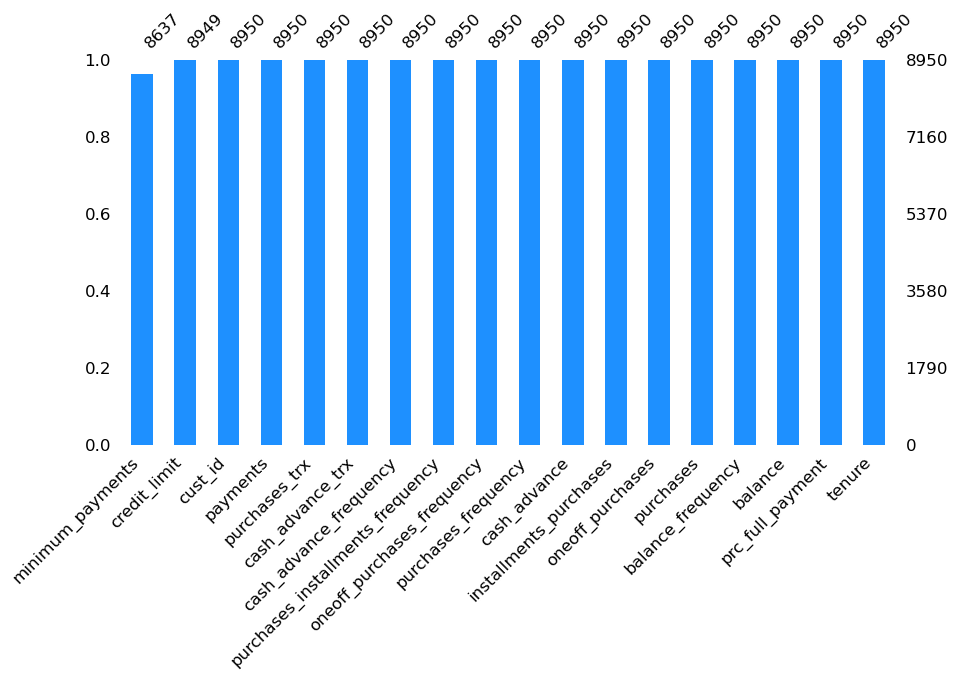

In [32]:
missingno.bar(df,color="dodgerblue", sort="ascending", figsize=(10,5), fontsize=12)


In [33]:
# import library

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [34]:
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# filling missing value with iterative imputer
feat_cols = [col for col in numeric_df.columns]

itr_imputer = IterativeImputer(initial_strategy='median', 
                               min_value=0, random_state=2022)

df[feat_cols] = itr_imputer.fit_transform(df[feat_cols])

In [35]:
df

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,431.220633,0.000000,12.0
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,346.308637,0.000000,6.0
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0


<Axes: >

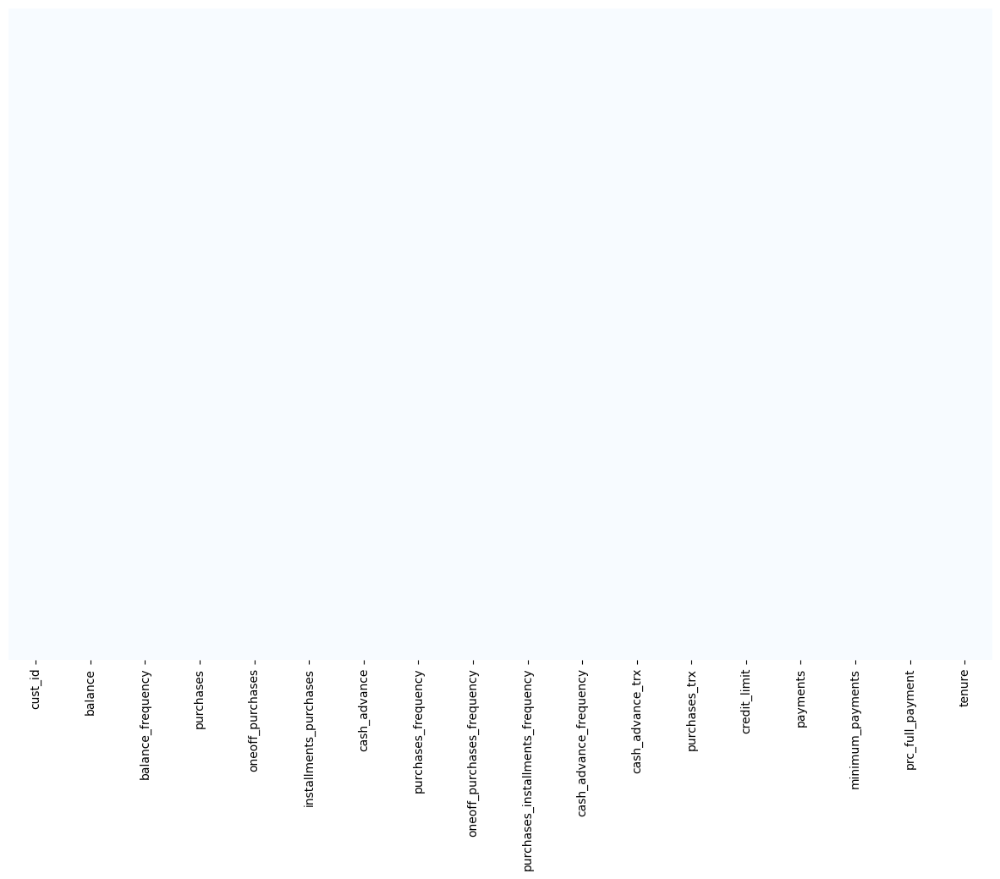

In [36]:
# plot to check the missing value
plt.figure(figsize = (15,10))
sns.heatmap(df.isnull(), cmap='Blues', cbar=False, yticklabels=False, xticklabels=df.columns)


In [37]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8950 non-null   object 
 1   balance                           8950 non-null   float64
 2   balance_frequency                 8950 non-null   float64
 3   purchases                         8950 non-null   float64
 4   oneoff_purchases                  8950 non-null   float64
 5   installments_purchases            8950 non-null   float64
 6   cash_advance                      8950 non-null   float64
 7   purchases_frequency               8950 non-null   float64
 8   oneoff_purchases_frequency        8950 non-null   float64
 9   purchases_installments_frequency  8950 non-null   float64
 10  cash_advance_frequency            8950 non-null   float64
 11  cash_advance_trx                  8950 non-null   float64
 12  purcha

In [38]:
df_model = df.copy()


In [39]:
# droppping unused feature
df_model.drop(['cust_id', 'balance', 'purchases', 
           'cash_advance', 'cash_advance_trx', 
           'purchases_trx', 'credit_limit', 
           'payments', 'minimum_payments', 'tenure'], 
          axis=1, inplace=True, errors='ignore')
df_model.columns

Index(['balance_frequency', 'oneoff_purchases', 'installments_purchases',
       'purchases_frequency', 'oneoff_purchases_frequency',
       'purchases_installments_frequency', 'cash_advance_frequency',
       'prc_full_payment'],
      dtype='object')

In [40]:
df_model

,balance_frequency,oneoff_purchases,installments_purchases,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,prc_full_payment
0,0.818182,0.00,95.40,0.166667,0.000000,0.083333,0.000000,0.000000
1,0.909091,0.00,0.00,0.000000,0.000000,0.000000,0.250000,0.222222
2,1.000000,773.17,0.00,1.000000,1.000000,0.000000,0.000000,0.000000
3,0.636364,1499.00,0.00,0.083333,0.083333,0.000000,0.083333,0.000000
4,1.000000,16.00,0.00,0.083333,0.083333,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
8945,1.000000,0.00,291.12,1.000000,0.000000,0.833333,0.000000,0.500000
8946,1.000000,0.00,300.00,1.000000,0.000000,0.833333,0.000000,0.000000
8947,0.833333,0.00,144.40,0.833333,0.000000,0.666667,0.000000,0.250000
8948,0.833333,0.00,0.00,0.000000,0.000000,0.000000,0.166667,0.250000


In [41]:
# change oneoff_purchase to oneoff_proportion
oneoff_proportion = df['oneoff_purchases'] / df['purchases']

# change installments_purchase to installments_proportion
installments_proportion = df['installments_purchases'] / df['purchases']


In [42]:
# rename columns
df_model.rename(columns={'oneoff_purchases_frequency': 'oneoff_frequency',
                     'purchases_installments_frequency': 'installments_frequency',
                     'prc_full_payment': 'payments_proportion'},
            inplace=True, errors='ignore')
df_model.columns

Index(['balance_frequency', 'oneoff_purchases', 'installments_purchases',
       'purchases_frequency', 'oneoff_frequency', 'installments_frequency',
       'cash_advance_frequency', 'payments_proportion'],
      dtype='object')

In [43]:
# check changed feature
df_model.head().T

,0,1,2,3,4
balance_frequency,0.818182,0.909091,1.00,0.636364,1.000000
oneoff_purchases,0.000000,0.000000,773.17,1499.000000,16.000000
installments_purchases,95.400000,0.000000,0.00,0.000000,0.000000
purchases_frequency,0.166667,0.000000,1.00,0.083333,0.083333
oneoff_frequency,0.000000,0.000000,1.00,0.083333,0.083333
installments_frequency,0.083333,0.000000,0.00,0.000000,0.000000
cash_advance_frequency,0.000000,0.250000,0.00,0.083333,0.000000
payments_proportion,0.000000,0.222222,0.00,0.000000,0.000000


In [44]:
# creating function for detailed descriptive analytic
def summary_stats(df_model, n=4):
    # central tendency: mean, median
    mean = pd.DataFrame(df_model.apply(np.mean)).T
    median = pd.DataFrame(df_model.apply(np.median)).T

    # distribution: ,std, min, max, range, skew, kurtosis
    std = pd.DataFrame(df_model.apply(np.std)).T
    min_value = pd.DataFrame(df_model.apply(min)).T
    max_value = pd.DataFrame(df_model.apply(max)).T
    range_value = pd.DataFrame(df_model.apply(lambda x: x.max() - x.min())).T
    skewness = pd.DataFrame(df_model.apply(lambda x: x.skew())).T
    kurtosis = pd.DataFrame(df_model.apply(lambda x: x.kurtosis())).T

    # concatenates
    summary_stats = pd.concat([min_value, max_value, range_value, mean, median, std, skewness, kurtosis]).T.reset_index()
    summary_stats.columns = ['attributes','min','max', 'range','mean','median', 'std','skewness','kurtosis']
    
    return round(summary_stats, n)

In [45]:
# descriptive analytic for modeling feature
summary_stats(df_model)

,attributes,min,max,range,mean,median,std,skewness,kurtosis
0,balance_frequency,0.0,1.00,1.00,0.8773,1.0000,0.2369,-2.0233,3.0924
1,oneoff_purchases,0.0,40761.25,40761.25,592.4374,38.0000,1659.7952,10.0451,164.1876
2,installments_purchases,0.0,22500.00,22500.00,411.0676,89.0000,904.2876,7.2991,96.5752
3,purchases_frequency,0.0,1.00,1.00,0.4904,0.5000,0.4013,0.0602,-1.6386
4,oneoff_frequency,0.0,1.00,1.00,0.2025,0.0833,0.2983,1.5356,1.1618
5,installments_frequency,0.0,1.00,1.00,0.3644,0.1667,0.3974,0.5092,-1.3986
6,cash_advance_frequency,0.0,1.00,1.00,0.1350,0.0000,0.1992,1.7886,2.9908
7,payments_proportion,0.0,1.00,1.00,0.1537,0.0000,0.2925,1.9428,2.4324


In [46]:
# Knowing proportion anomalies (nan, inf, more_than_1)
def proportion_anomalies():
    nan_oneoff_proportion = np.isnan(oneoff_proportion).sum()
    nan_installments_proportion = np.isnan(installments_proportion).sum()
    inf_oneoff_proportion = np.isinf(oneoff_proportion).sum()
    inf_installments_proportion = np.isinf(installments_proportion).sum()
    more_than_1_oneoff_proportion = len(oneoff_proportion[oneoff_proportion > 1])
    more_than_1_installments_proportion = len(installments_proportion[installments_proportion > 1])

    proportion_anomalies = pd.DataFrame({'nan': [nan_oneoff_proportion, nan_installments_proportion],
                                        'inf': [inf_oneoff_proportion, inf_installments_proportion],
                                        'more_than_1': [more_than_1_oneoff_proportion, more_than_1_installments_proportion]},
                                        index=['oneoff_proportion', 'installments_proportion'])

    return proportion_anomalies

In [47]:
proportion_anomalies()


,nan,inf,more_than_1
oneoff_proportion,2044,0,3
installments_proportion,2042,2,14


In [48]:
df[np.isnan(installments_proportion)].loc[:, ['purchases', 'installments_purchases']].value_counts()

purchases  installments_purchases
0.0        0.0                       2042
Name: count, dtype: int64

In [49]:
df[np.isnan(oneoff_proportion)].iloc[:, 2:4].value_counts()


balance_frequency  purchases
1.000000           0.0          1435
0.909091           0.0            84
0.818182           0.0            47
0.727273           0.0            41
0.363636           0.0            36
0.545455           0.0            35
0.454545           0.0            35
0.636364           0.0            32
0.181818           0.0            28
0.272727           0.0            24
0.900000           0.0            21
0.875000           0.0            21
0.833333           0.0            19
0.857143           0.0            19
0.666667           0.0            18
0.090909           0.0            18
0.888889           0.0            15
0.500000           0.0            14
0.333333           0.0            12
0.714286           0.0             8
0.000000           0.0             8
0.777778           0.0             7
0.555556           0.0             5
0.125000           0.0             5
0.750000           0.0             4
0.285714           0.0             4
0.400000 

In [50]:
# Fill NaN value with zero value
oneoff_proportion.fillna(0, inplace=True)
installments_proportion.fillna(0, inplace=True)

# check anomalies
proportion_anomalies()

,nan,inf,more_than_1
oneoff_proportion,0,0,3
installments_proportion,0,2,14


In [51]:
df.iloc[installments_proportion[installments_proportion == np.inf].index].iloc[:,2:5]


,balance_frequency,purchases,oneoff_purchases
4682,1.0,0.0,0.0
5737,1.0,0.0,0.0


In [52]:
# Mengubah inf menjadi 1
# inf hasil dari x/0 dimana x>0
inf_to_1 = installments_proportion[installments_proportion == np.inf].index
installments_proportion.iloc[inf_to_1] = 1

proportion_anomalies()

,nan,inf,more_than_1
oneoff_proportion,0,0,3
installments_proportion,0,0,12


In [53]:
# Mengubah nilai >1 menjadi 1
# data hanya sedikit sehingga distribusinya tidak akan rusak
oneoff_more_than_1 = oneoff_proportion[oneoff_proportion > 1].index
oneoff_proportion.iloc[oneoff_more_than_1] = 1

installments_more_than_1 = installments_proportion[installments_proportion > 1].index
installments_proportion.iloc[installments_more_than_1] = 1

proportion_anomalies()

,nan,inf,more_than_1
oneoff_proportion,0,0,0
installments_proportion,0,0,0


In [54]:
# change the oneoff_purchase with oneoff_proportion and installment_purchase with installment_proportion
df_model.oneoff_purchases = oneoff_proportion
df_model.installments_purchases = installments_proportion

In [55]:
df_model.rename(columns={'oneoff_purchases': 'oneoff_proportion',
                     'installments_purchases': 'installments_proportion'},
            inplace=True)
df_model.head()

,balance_frequency,oneoff_proportion,installments_proportion,purchases_frequency,oneoff_frequency,installments_frequency,cash_advance_frequency,payments_proportion
0,0.818182,0.0,1.0,0.166667,0.000000,0.083333,0.000000,0.000000
1,0.909091,0.0,0.0,0.000000,0.000000,0.000000,0.250000,0.222222
2,1.000000,1.0,0.0,1.000000,1.000000,0.000000,0.000000,0.000000
3,0.636364,1.0,0.0,0.083333,0.083333,0.000000,0.083333,0.000000
4,1.000000,1.0,0.0,0.083333,0.083333,0.000000,0.000000,0.000000


In [56]:
# descriptive analytic for modeling feature
summary_stats(df_model)

,attributes,min,max,range,mean,median,std,skewness,kurtosis
0,balance_frequency,0.0,1.0,1.0,0.8773,1.0000,0.2369,-2.0233,3.0924
1,oneoff_proportion,0.0,1.0,1.0,0.3795,0.1114,0.4256,0.4578,-1.5581
2,installments_proportion,0.0,1.0,1.0,0.3923,0.1851,0.4290,0.4509,-1.5629
3,purchases_frequency,0.0,1.0,1.0,0.4904,0.5000,0.4013,0.0602,-1.6386
4,oneoff_frequency,0.0,1.0,1.0,0.2025,0.0833,0.2983,1.5356,1.1618
5,installments_frequency,0.0,1.0,1.0,0.3644,0.1667,0.3974,0.5092,-1.3986
6,cash_advance_frequency,0.0,1.0,1.0,0.1350,0.0000,0.1992,1.7886,2.9908
7,payments_proportion,0.0,1.0,1.0,0.1537,0.0000,0.2925,1.9428,2.4324


In [57]:
# Model Init
number_of_cluster = np.arange(2,11) # Number of Clusters
np.random.seed(2022) # Set global randomseed for sklearn models

In [58]:
#running PCA with full components
pca_all = PCA(n_components=len(df_model.columns), random_state = 2022)
pca_all.fit(df_model)
variance = pca_all.explained_variance_ratio_
var = np.cumsum(variance)*100

#plot for information extracted
fig = px.line(x=np.arange(len(df_model.columns))+1, y=var, markers=True)
fig.update_xaxes(title_text='# of Features')
fig.update_yaxes(title_text='% Variance Explained')
fig.update_layout(width=900)

In [59]:
print('information extracted {} %'.format(np.sum(variance[:2])*100/np.sum(variance)))


information extracted 74.36177536969971 %


In [60]:
# Reducing the dimensions of the data 
pca_n = PCA(n_components = 2, random_state = 2022) 
X_principal = pca_n.fit_transform(df_model)
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 

summary_stats(X_principal)

,attributes,min,max,range,mean,median,std,skewness,kurtosis
0,P1,-0.8981,1.2076,2.1057,0.0,-0.0802,0.6634,0.2955,-1.424
1,P2,-0.8021,1.2440,2.0461,0.0,-0.1209,0.5193,0.4634,-0.921


In [61]:
#plot for dimensions after pca
fig = go.Figure(go.Scatter(
    x=X_principal['P1'], y=X_principal['P2'], mode='markers'))
fig.update_xaxes(title_text='P2')
fig.update_yaxes(title_text='P1')
fig.update_layout(height=700, width=700,
                  title_text='Principal Component Analysis')

In [62]:
# Create Accumulator for matric
ward_s_scores = []
ward_db_scores = []
ward_calinski_scores = []
average_s_scores = []
average_db_scores = []
average_calinski_scores = []
complete_s_scores = []
complete_db_scores = []
complete_calinski_scores = []

agglo_metrics = {'ward': [ward_s_scores, ward_db_scores, ward_calinski_scores, 'rgb(128,177,211)'],
                 'average': [average_s_scores, average_db_scores, average_calinski_scores, 'rgb(141,211,199)'],
                 'complete': [complete_s_scores, complete_db_scores, complete_calinski_scores, 'rgb(251,128,114)']}

for i, j in product(agglo_metrics, number_of_cluster):
    agglo = AgglomerativeClustering(linkage=i, n_clusters=j)
    agglo.fit(X_principal)
    agglo_metrics[i][0].append(silhouette_score(
        X_principal, agglo.labels_))
    agglo_metrics[i][1].append(davies_bouldin_score(
        X_principal, agglo.labels_))
    agglo_metrics[i][2].append(calinski_harabasz_score(
        X_principal, agglo.labels_))

In [63]:
#silhouette score between each method
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=.01)

for i in agglo_metrics:
    for j, k in zip(range(1, 4), ['Silhouette', 'Davies Bouldin', 'Calinski-Harabasz']):
        fig.append_trace(go.Scatter(x=list(number_of_cluster), y=agglo_metrics[i][j-1], name=i.title(),
                                    legendgroup=i, line_color=agglo_metrics[i][-1],
                                    showlegend=False if j != 1 else True), row=j, col=1)
        fig.update_yaxes(title_text=k, row=j, col=1)

fig.update_xaxes(title_text='Number of Clusters', row=3)
fig.update_layout(height=800, width=900,
                  legend_title_text='Metrics',
                  title_text='Agglomerative Clustering Metric Scores')


In [64]:
#comparing result
compare_agg = pd.DataFrame({'Method' : ['Ward', 'Average', 'Complete'],
                  'n Cluster' :['7', '4', '7'],
                  'Silhouete Score' : [ward_s_scores[5], average_s_scores[2], complete_s_scores[5]],
                  'Davies Score' : [ward_db_scores[5], average_db_scores[2], complete_db_scores[5]],
                  'Calinski Score' : [ward_calinski_scores[5], average_calinski_scores[2], complete_calinski_scores[5]]})
compare_agg

,Method,n Cluster,Silhouete Score,Davies Score,Calinski Score
0,Ward,7,0.587972,0.660127,17726.983231
1,Average,4,0.539578,0.780485,12382.511379
2,Complete,7,0.562733,0.687193,15596.701072


In [65]:
#creating new dataframe for agglomerative clustering
df_dend = X_principal.copy()

In [66]:
#adding new columns for ward
agg_ward = AgglomerativeClustering(n_clusters=7, linkage='ward')
df_dend['ward'] = agg_ward.fit_predict(X_principal)

#adding new columns for average
agg_average = AgglomerativeClustering(n_clusters=4, linkage='average')
df_dend['average'] = agg_average.fit_predict(X_principal)

#adding new columns for complete
agg_complete = AgglomerativeClustering(n_clusters=7, linkage='complete')
df_dend['complete'] = agg_complete.fit_predict(X_principal)

#showing dataframe
df_dend

,P1,P2,ward,average,complete
0,0.120839,-0.686759,1,3,5
1,-0.574746,-0.531580,5,2,4
2,-0.340810,1.088950,2,0,2
3,-0.827459,0.203100,3,0,0
4,-0.805541,0.244671,3,0,0
...,...,...,...,...,...
8945,1.037297,-0.172397,4,3,3
8946,0.960048,-0.214153,4,3,3
8947,0.816555,-0.303037,1,3,5
8948,-0.565310,-0.531013,5,2,4


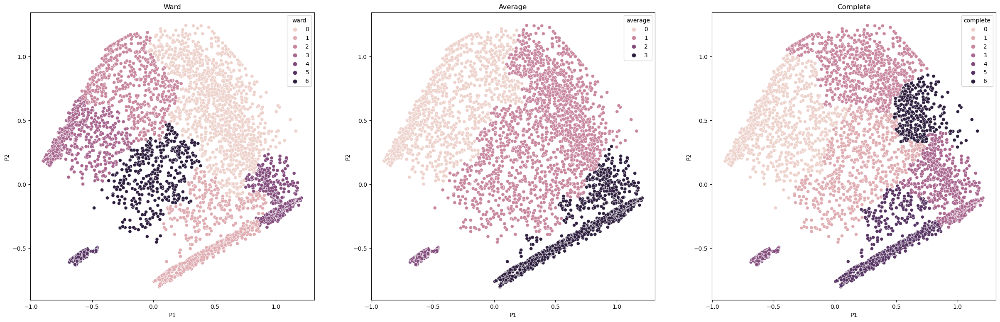

In [67]:
#creating visualization to compare the result from the best score for each agglomerative clustering method
num, hue = 0, ['ward', 'average', 'complete']
plt.figure(figsize=(30, 9))
for i in hue:
    num += 1
    plt.subplot(1, 3, num)
    sns.scatterplot(x='P1', y='P2', hue=i, data=df_dend)
    plt.title(i.title())

In [68]:
#creating list for scoring
avg_withinSS = []

#create loop to run the algorithm
for i in number_of_cluster:
    kmeans = KMeans(n_clusters=i, random_state = 2022)
    kmeans.fit(X_principal)
    centroids = kmeans.cluster_centers_

    D_k = cdist(X_principal, centroids, 'euclidean')
    cIdx = np.argmin(D_k, axis=1)
    dist = np.min(D_k, axis=1)
    avg_withinSS.append(sum(dist)/X_principal.shape[0])

#creating plot for elbow method visualization
fig = px.line(x=number_of_cluster, y=avg_withinSS, markers=True)
fig.update_xaxes(title_text='Number of Clusters')
fig.update_yaxes(title_text='Average Within Sum of Square')
fig.update_layout(width=900)

In [69]:
# Create Accumulator for matric
kmeans_s_scores = []
kmeans_db_scores = []
kmeans_calinski_scores = []

#looping for modeling
for i in number_of_cluster:
    kmeans = KMeans(n_clusters=i, random_state = 2022)
    kmeans.fit(X_principal)
    kmeans_labels = kmeans.predict(X_principal)
    kmeans_s_scores.append(silhouette_score(
        X_principal, kmeans_labels, metric='euclidean'))
    kmeans_db_scores.append(davies_bouldin_score(X_principal, kmeans_labels))
    kmeans_calinski_scores.append(
        calinski_harabasz_score(X_principal, kmeans_labels))

In [70]:
#creating plot for scoring visualization
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=.01)
kmeans_score = {'Silhouette': kmeans_s_scores,
                'Davies Bouldin': kmeans_db_scores,
                'Calinski-Harabasz': kmeans_calinski_scores}

for i, score in zip(np.arange(1, 4), kmeans_score):
    fig.append_trace(go.Scatter(
        x=list(number_of_cluster), y=kmeans_score[score], name=score), row=i, col=1)
    fig.update_yaxes(title_text=score, row=i, col=1)

fig.update_xaxes(title_text='Number of Clusters', row=3)
fig.update_layout(height=800, width=900,
                  showlegend=False,
                  title_text='Metric Scores')

In [71]:
#creating list for metrics
kmeans_std_s_scores = []
kmeans_std_db_scores = []
kmeans_std_calinski_scores = []

#parameter for checking the cluster stability
n_sets = 8
sets = np.array_split(X_principal, n_sets)

# calculates the scores and store in their respective list
for element in sets:
    kmeans = KMeans(n_clusters=4, random_state = 2022)
    kmeans.fit(element)
    kmeans_std_s_scores.append(silhouette_score(
        element, kmeans.labels_, metric='euclidean'))
    kmeans_std_db_scores.append(davies_bouldin_score(element, kmeans.labels_))
    kmeans_std_calinski_scores.append(
        calinski_harabasz_score(element, kmeans.labels_))

#check the cluster stability
print(f'Standard deviation Kmeans with {4} clusters:\nSilouette: {np.std(kmeans_std_s_scores)}\nDavies Bouldin: {np.std(kmeans_std_db_scores)}\nCalinski Harabasz: {np.std(kmeans_std_calinski_scores)}\n')

Standard deviation Kmeans with 4 clusters:
Silouette: 0.027023101060602413
Davies Bouldin: 0.06268617578764962
Calinski Harabasz: 368.2471234298265



In [72]:
#choosing 4 cluster as the best number of cluster
kmeans = KMeans(n_clusters=4, random_state = 2022)
kmeans.fit(X_principal)

KMeans(n_clusters=4, random_state=2022)

In [73]:
#plot to visualize the result
fig = px.scatter(X_principal, x='P1', y='P2',
                 color=list(map(lambda x: str(x), kmeans.labels_)))
fig.add_trace(go.Scatter(x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1], mode='markers',
                         marker_color='rgba(152, 0, 0, .8)', marker_size=15, name='Centroids'))

fig.update_xaxes(title_text='P1')
fig.update_yaxes(title_text='P2')
fig.update_layout(height=700, width=800,
                  legend_title_text='Clusters',
                  title_text='K-Means with 4 Clusters')

In [74]:
#creating list for metrics
manhattan_avg_withinSS = []
euclidean_avg_withinSS = []
cosine_avg_withinSS = []

#creating list for metrics
kmedoids_avg_withinSS = {'cityblock': manhattan_avg_withinSS,
                         'euclidean': euclidean_avg_withinSS,
                         'cosine': cosine_avg_withinSS}

#looping for running k-medoids
for i, j in product(kmedoids_avg_withinSS, number_of_cluster):
    kmedoids = KMedoids(metric=i, n_clusters=j, random_state = 2022)
    kmedoids.fit(X_principal)

    D_k = cdist(X_principal, kmedoids.cluster_centers_, i)
    cIdx = np.argmin(D_k, axis=1)
    dist = np.min(D_k, axis=1)
    kmedoids_avg_withinSS[i].append(sum(dist)/X_principal.shape[0])

#creating plot to visualize elbow method scoring
fig = go.Figure()
for i in kmedoids_avg_withinSS:
    fig.add_trace(go.Scatter(x=list(number_of_cluster),
                  y=kmedoids_avg_withinSS[i], 
                  name=i if i != 'cityblock' else 'manhattan'))

fig.update_xaxes(title_text='Number of Clusters')
fig.update_yaxes(title_text='Average Within Sum of Square')
fig.update_layout(width=900, legend_title_text='Metrics')

In [75]:
# Create Accumulator for matric
manhattan_s_scores = []
manhattan_db_scores = []
manhattan_calinski_scores = []
euclidean_s_scores = []
euclidean_db_scores = []
euclidean_calinski_scores = []
cosine_s_scores = []
cosine_db_scores = []
cosine_calinski_scores = []

kmedoids_metrics = {'manhattan': [manhattan_s_scores, manhattan_db_scores, manhattan_calinski_scores, 'rgb(128,177,211)'],
                    'euclidean': [euclidean_s_scores, euclidean_db_scores, euclidean_calinski_scores, 'rgb(141,211,199)'],
                    'cosine': [cosine_s_scores, cosine_db_scores, cosine_calinski_scores, 'rgb(251,128,114)']}

#looping to run k-medoids by each distance metrics
for i, j in product(kmedoids_metrics, number_of_cluster):
    kmedoids = KMedoids(metric=i, n_clusters=j, random_state = 2022)
    kmedoids.fit(X_principal)
    kmedoids_metrics[i][0].append(silhouette_score(
        X_principal, kmedoids.labels_, metric=i))
    kmedoids_metrics[i][1].append(davies_bouldin_score(
        X_principal, kmedoids.labels_))
    kmedoids_metrics[i][2].append(calinski_harabasz_score(
        X_principal, kmedoids.labels_))

In [76]:
#creating plot to compare the result
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=.01)

for i in kmedoids_metrics:
    for j, k in zip(range(1, 4), ['Silhouette', 'Davies Bouldin', 'Calinski-Harabasz']):
        fig.append_trace(go.Scatter(x=list(number_of_cluster), y=kmedoids_metrics[i][j-1], name=i.title(),
                                    legendgroup=i, line_color=kmedoids_metrics[i][-1],
                                    showlegend=False if j != 1 else True), row=j, col=1)
        fig.update_yaxes(title_text=k, row=j, col=1)

fig.update_xaxes(title_text='Number of Clusters', row=3)
fig.update_layout(height=800, width=900,
                  legend_title_text='Metrics',
                  title_text='Metric Scores',
                  legend_traceorder='reversed')

In [77]:
#using 4 as number of clusters
kmedoids_manhattan = KMedoids(metric="manhattan", n_clusters=4, random_state = 2022)
kmedoids_euclidean = KMedoids(metric="euclidean", n_clusters=4, random_state = 2022)
kmedoids_cosine = KMedoids(metric="cosine", n_clusters=4, random_state = 2022)

#running the algorithm
kmedoids_manhattan.fit(X_principal)
kmedoids_euclidean.fit(X_principal)
kmedoids_cosine.fit(X_principal);

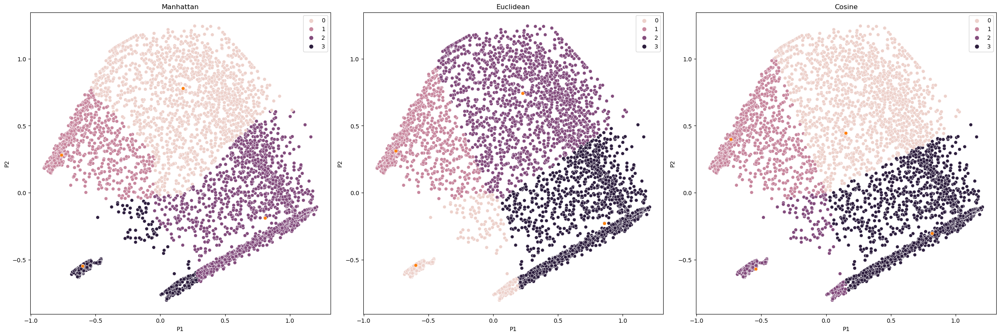

In [78]:
#creating plot to compare the result by each distance parameter
kmedoids_graph = {'Manhattan': kmedoids_manhattan,
                  'Euclidean': kmedoids_euclidean,
                  'Cosine': kmedoids_cosine}

plt.figure(figsize=(24, 8), constrained_layout=True)
for i, j in zip(kmedoids_graph, range(1,4)):
    plt.subplot(1,3,j)
    sns.scatterplot(x='P1', y='P2', data=X_principal,
                    hue= kmedoids_graph[i].labels_)
    sns.scatterplot(data = None,
                    x = kmedoids_graph[i].cluster_centers_[:,0], 
                    y = kmedoids_graph[i].cluster_centers_[:,1])
    plt.title(i)

In [79]:
df_compare = pd.DataFrame({'Model' : ['Agglomerative (Average)', 'K-Means', 'K-Medoids (Cosine)'],
              'N Cluster' : [4, 4, 4],
              'Silhouette Score' : [average_s_scores[2], kmeans_s_scores[2], cosine_s_scores[2]],
              'Devies Bouldin Score' : [average_db_scores[2], kmeans_db_scores[2], cosine_db_scores[2]],
              'Calinski Harabasz Score' : [average_calinski_scores[2], kmeans_calinski_scores[2], cosine_calinski_scores[2]]
             })
df_compare

,Model,N Cluster,Silhouette Score,Devies Bouldin Score,Calinski Harabasz Score
0,Agglomerative (Average),4,0.539578,0.780485,12382.511379
1,K-Means,4,0.594107,0.605694,15797.008811
2,K-Medoids (Cosine),4,0.793790,0.605743,15759.260409


In [80]:
#choosing best model for clustering
model_fix = KMedoids(metric="cosine", n_clusters=4, random_state = 2022)
model_fix.fit(X_principal)
model_fix_centers = model_fix.cluster_centers_
model_fix_labels = model_fix.predict(X_principal)
model_fix_centers

array([[ 0.15269758,  0.44429008],
       [-0.73582344,  0.40039781],
       [-0.54443207, -0.56800667],
       [ 0.81655541, -0.30303682]])

In [81]:
#showing cluster
np.unique(model_fix_labels)

array([0, 1, 2, 3], dtype=int64)

In [82]:
#add the cluster to dataframe
df_cluster = pd.concat([df, pd.DataFrame({'cluster' :model_fix_labels})], axis = 1)
df_cluster.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,cluster
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,2
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,2
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,0
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,431.220633,0.000000,12.0,1
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,1


In [83]:
#cluster population
df_cluster['cluster'].value_counts()

cluster
3    2939
2    2287
1    2036
0    1688
Name: count, dtype: int64

In [84]:
#running PCA
pca_n = PCA(n_components = 2, random_state = 2022) 
X_principal = pca_n.fit_transform(df_model)
df_X_principal = pd.DataFrame(X_principal, columns = ['Principal Component 1', 'Principal Component 2'])
df_X_principal.head(2)

,Principal Component 1,Principal Component 2
0,0.120839,-0.686759
1,-0.574746,-0.531580


In [85]:
#combine pca and cluster
finalDf = pd.concat([df_X_principal, pd.DataFrame({'cluster':model_fix_labels})], axis = 1)
finalDf.head()

,Principal Component 1,Principal Component 2,cluster
0,0.120839,-0.686759,2
1,-0.574746,-0.531580,2
2,-0.340810,1.088950,0
3,-0.827459,0.203100,1
4,-0.805541,0.244671,1


In [86]:
#plot for visualization
fig = go.Figure()

def cluster(cluster, color):
    fig.add_trace(go.Scatter(
        x=finalDf[finalDf.cluster == cluster]['Principal Component 1'],
        y=finalDf[finalDf.cluster == cluster]['Principal Component 2'],
        mode='markers',
        name=f'Cluster {cluster}',
        marker_color=color))

for C in list(finalDf.cluster.unique()):
    if C == 0:
        cluster(0, 'red')
    elif C == 1:
        cluster(1, 'green')
    elif C == 2:
        cluster(2, 'blue')
    elif C == 3:
        cluster(3, 'purple')

fig.add_trace(go.Scatter(x=model_fix_centers[:, 0], y=model_fix_centers[:, 1], mode='markers',
                         marker_color='rgba(152, 0, 0, .8)', marker_size=15, name='Centroids'))

fig.update_xaxes(title_text='Principal Component 1')
fig.update_yaxes(title_text='Principal Component 2')
fig.update_layout(height=900, width=1100,
                  legend_title_text='Clusters',
                  title_text='K-Medoids with 4 Clusters')

In [87]:
#creating new df for cluster analysis
df_cluster = pd.concat([df_cluster, df_model[['oneoff_proportion',
                 'installments_proportion', 'payments_proportion']]], axis=1)

In [88]:
#separating the dataframe by cluster
cluster_0 = df_cluster[df_cluster['cluster'] == 0]
cluster_1 = df_cluster[df_cluster['cluster'] == 1]
cluster_2 = df_cluster[df_cluster['cluster'] == 2]
cluster_3 = df_cluster[df_cluster['cluster'] == 3]

In [89]:
#summary for each cluster
need_columns = ['balance', 'purchases', 'cash_advance', 'credit_limit', 'payments']
d={}
for i in need_columns:  
    d[i] = pd.DataFrame(df_cluster.groupby('cluster', axis = 0)[i].describe()[['mean', '50%', 'min', 'max']])

pd.concat(d, axis =1)

balance                                        purchases  \
                mean          50%       min          max         mean   
cluster                                                                 
0        1867.071485   975.679015  1.198223  19043.13856  2948.853477   
1        1520.726547   918.797179  0.000000  15258.22590   739.299317   
2        2047.578186  1381.753281  0.000000  14581.45914    22.275111   
3        1045.056985   208.362536  0.000000  16304.88925   831.868663   

                                  cash_advance                                 \
              50%   min       max         mean          50%  min          max   
cluster                                                                         
0        1971.195  8.40  49039.57   661.414446     0.000000  0.0  29282.10915   
1         384.975  0.01  26784.62   935.488227     0.000000  0.0  20277.33112   
2           0.000  0.00   3000.00  1845.579159  1090.520215  0.0  26194.04954   
3         462.860  4.44  22500.00   516.820451     0.000000  0.0  47137.21176   

        credit_limit                             payments                    \
                mean     50%    min      max         mean          50%  min   
cluster                                                                       
0        6454.697329  6000.0  300.0  30000.0  3022.354523  1871.896384  0.0   
1        4392.651217  3000.0  150.0  30000.0  1485.728802   732.711626  0.0   
2        4033.301508  3000.0   50.0  19000.0  1608.335929   718.951070  0.0   
3        3797.320345  2700.0  300.0  23000.0  1261.209571   662.417377  0.0   

                      
                 max  
cluster               
0        46930.59824  
1        50721.48336  
2        34107.07499  
3        40627.59524

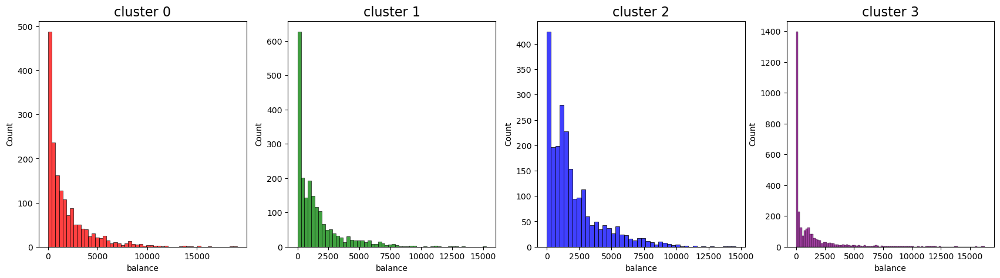

In [90]:
#plot comparison balance from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['balance'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['balance'], color='green' )
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['balance'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['balance'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

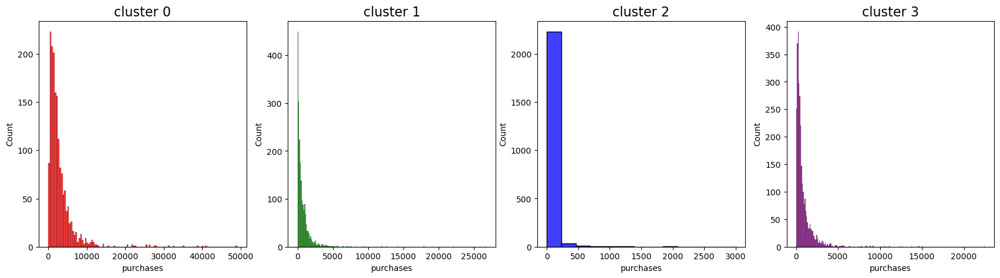

In [91]:
#plot comparison purchase from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['purchases'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['purchases'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['purchases'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['purchases'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

Text(0.5, 1.0, 'Purchases Persentage')

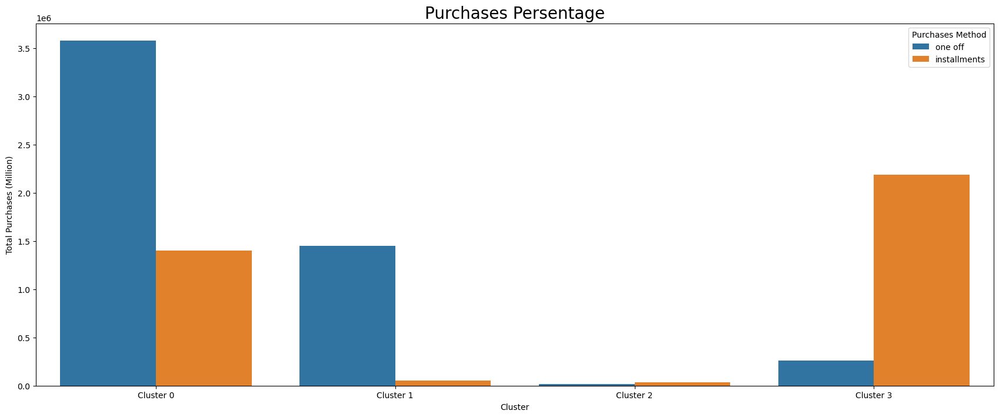

In [92]:
#Check Detail Purchases
plt.figure(figsize=(21,8))
ax = pd.DataFrame({'Cluster' : ['Cluster 0', 'Cluster 0', 'Cluster 1', 'Cluster 1','Cluster 2', 'Cluster 2','Cluster 3', 'Cluster 3'],
                    'Purchases' : [cluster_0['oneoff_purchases'].sum(), 
                                   cluster_0['installments_purchases'].sum(),
                                   cluster_1['oneoff_purchases'].sum(), 
                                   cluster_1['installments_purchases'].sum(),
                                   cluster_2['oneoff_purchases'].sum(), 
                                   cluster_2['installments_purchases'].sum(),
                                   cluster_3['oneoff_purchases'].sum(),
                                   cluster_3['installments_purchases'].sum()], 
                    'Purchases Method' : ['one off', 'installments', 'one off', 'installments', 'one off', 'installments', 'one off', 'installments']})
sns.barplot(x='Cluster', y='Purchases', data=ax, hue = 'Purchases Method' )
plt.ylabel('Total Purchases (Million)')
plt.xlabel('Cluster')
plt.title('Purchases Persentage', size = 20)

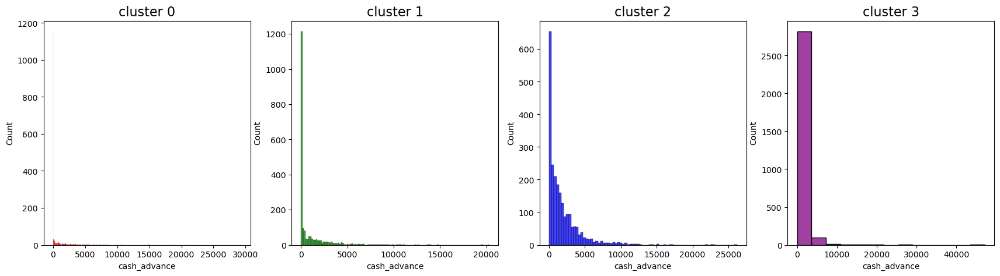

In [93]:
#plot comparison cash advance from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['cash_advance'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['cash_advance'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['cash_advance'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['cash_advance'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

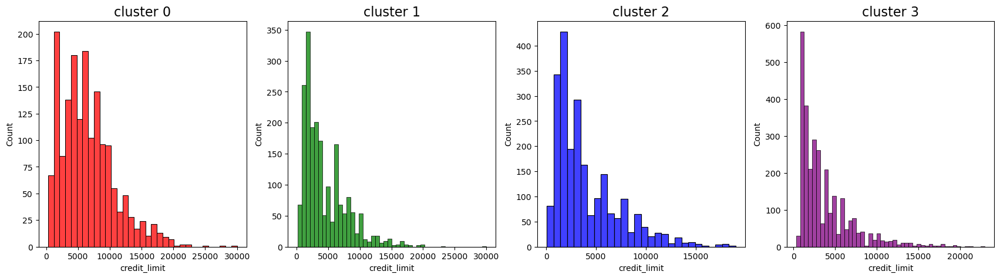

In [94]:
#plot comparison credit limit from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['credit_limit'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['credit_limit'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['credit_limit'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['credit_limit'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

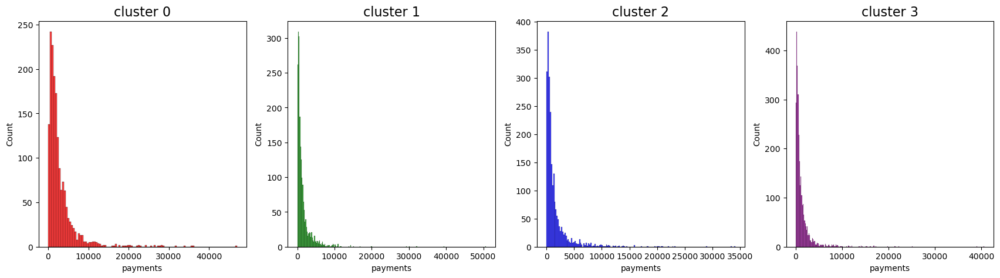

In [95]:
##plot comparison payments from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['payments'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['payments'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['payments'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['payments'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

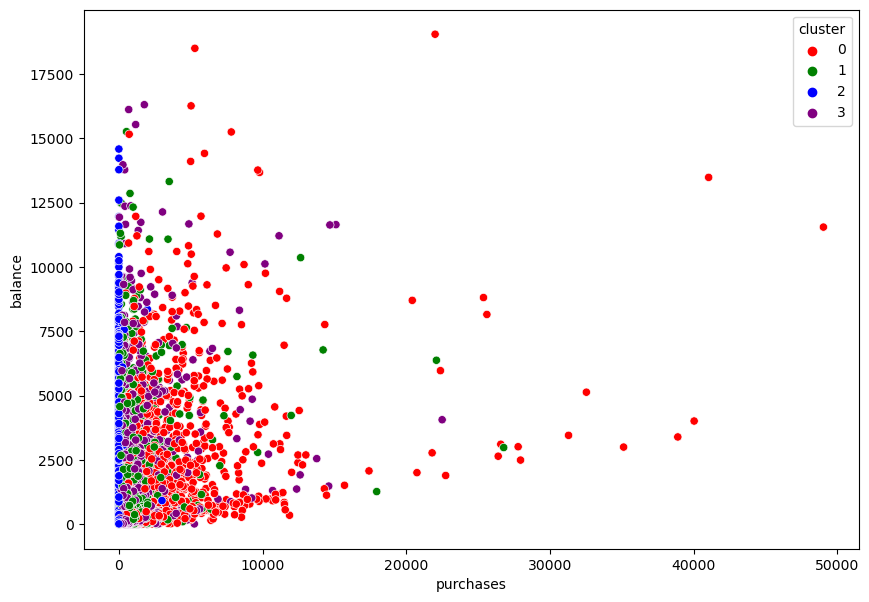

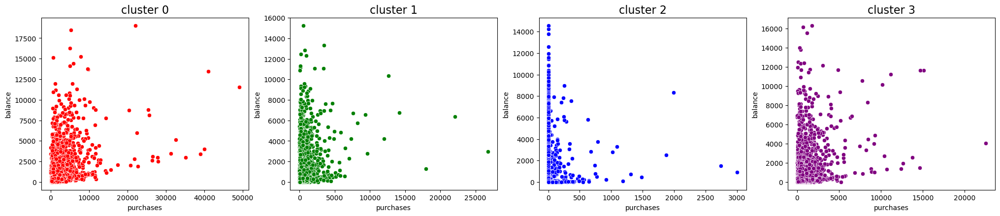

In [96]:
#plot comparison purchase from each cluster
plt.figure(figsize=(10,7))
sns.scatterplot(data = df_cluster, x = 'purchases', y = 'balance', hue = 'cluster',  palette=['red', 'green', 'blue', 'purple'])
plt.show()
plt.figure(figsize=(25,10))
plt.subplot(2,4,1)
sns.scatterplot(x=cluster_0['purchases'], y=cluster_0['balance'], color='red')
plt.title('cluster 0', size = 16)
plt.subplot(2,4,2)
sns.scatterplot(x=cluster_1['purchases'],y= cluster_1['balance'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(2,4,3)
sns.scatterplot(x=cluster_2['purchases'],y= cluster_2['balance'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(2,4,4)
sns.scatterplot(x=cluster_3['purchases'], y=cluster_3['balance'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

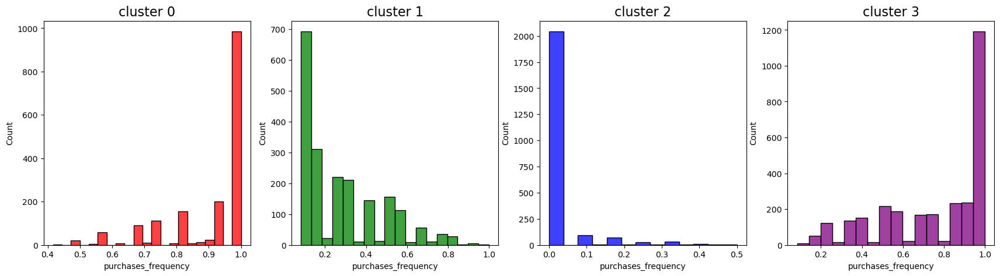

In [97]:
#plot comparison purchase frequency from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['purchases_frequency'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['purchases_frequency'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['purchases_frequency'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['purchases_frequency'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

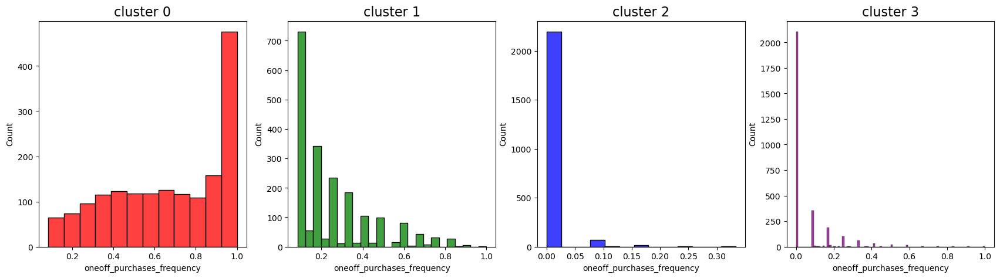

In [98]:
#plot comparison one off purchase from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['oneoff_purchases_frequency'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['oneoff_purchases_frequency'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['oneoff_purchases_frequency'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['oneoff_purchases_frequency'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

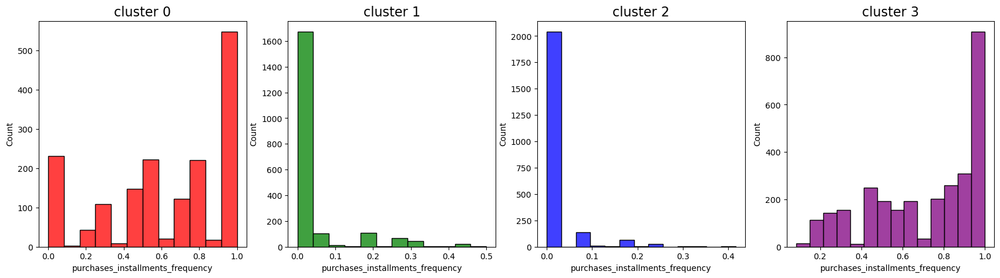

In [99]:
#plot comparison installment purchase from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['purchases_installments_frequency'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['purchases_installments_frequency'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['purchases_installments_frequency'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['purchases_installments_frequency'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

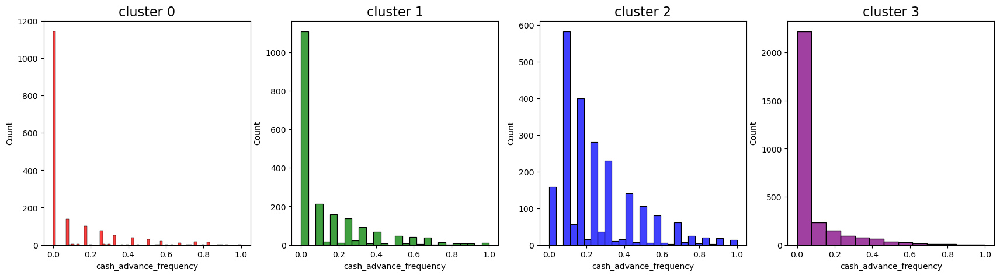

In [100]:
#plot comparison cash advance frequency from each cluster
plt.figure(figsize=(21,5))
plt.subplot(1,4,1)
sns.histplot(cluster_0['cash_advance_frequency'], color = 'red')
plt.title('cluster 0', size = 16)
plt.subplot(1,4,2)
sns.histplot(cluster_1['cash_advance_frequency'], color='green')
plt.title('cluster 1', size = 16)
plt.subplot(1,4,3)
sns.histplot(cluster_2['cash_advance_frequency'], color='blue')
plt.title('cluster 2', size = 16)
plt.subplot(1,4,4)
sns.histplot(cluster_3['cash_advance_frequency'], color='purple')
plt.title('cluster 3', size = 16)
plt.show()

In [101]:
#3d plot for oneoff purchase frequency, purchase installment frequency, and cash advance frequency
fig = go.Figure()

def cluster3d(cluster, color):
    fig.add_trace(go.Scatter3d(
        x=df_cluster[df_cluster.cluster == cluster]['oneoff_purchases_frequency'],
        y=df_cluster[df_cluster.cluster == cluster]['purchases_installments_frequency'],
        z=df_cluster[df_cluster.cluster == cluster]['cash_advance_frequency'],
        mode='markers',
        name=f'Cluster {cluster}',
        marker_color=color,
        marker_size=5))


for C in list(df_cluster.cluster.unique()):
    if C == 0:
        cluster3d(0, 'red')
    elif C == 1:
        cluster3d(1, 'green')
    elif C == 2:
        cluster3d(2, 'blue')
    elif C == 3:
        cluster3d(3, 'purple')

fig.update_layout(height=900, width=1100,
                  scene=dict(
                      xaxis_title='oneoff_purchases_frequency',
                      yaxis_title='purchases_installments_frequency',
                      zaxis_title='cash_advance_frequency'),
                  title_text='A 3D Projection Of Data In The Reduced Dimension')

In [102]:
save = pd.concat([df, pd.DataFrame(
    {'cluster': model_fix_labels})], axis=1)
save = pd.concat([save, df_model[['oneoff_proportion',
                 'installments_proportion', 'payments_proportion']]], axis=1)
save.drop('prc_full_payment', axis=1, inplace=True)
save = save[['cust_id', 'balance', 'balance_frequency', 
             'purchases', 'oneoff_purchases', 'installments_purchases', 'cash_advance',
             'oneoff_proportion', 'installments_proportion',
             'purchases_frequency', 'oneoff_purchases_frequency', 'purchases_installments_frequency', 'cash_advance_frequency',
             'purchases_trx', 'cash_advance_trx', 
             'credit_limit', 'payments', 'minimum_payments', 'payments_proportion', 
             'tenure', 'cluster']]
save.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,oneoff_proportion,installments_proportion,purchases_frequency,...,purchases_installments_frequency,cash_advance_frequency,purchases_trx,cash_advance_trx,credit_limit,payments,minimum_payments,payments_proportion,tenure,cluster
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.0,1.0,0.166667,...,0.083333,0.000000,2.0,0.0,1000.0,201.802084,139.509787,0.000000,12.0,2
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.0,0.0,0.000000,...,0.000000,0.250000,0.0,4.0,7000.0,4103.032597,1072.340217,0.222222,12.0,2
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.0,0.0,1.000000,...,0.000000,0.000000,12.0,0.0,7500.0,622.066742,627.284787,0.000000,12.0,0
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,1.0,0.0,0.083333,...,0.000000,0.083333,1.0,1.0,7500.0,0.000000,431.220633,0.000000,12.0,1
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,1.0,0.0,0.083333,...,0.000000,0.000000,1.0,0.0,1200.0,678.334763,244.791237,0.000000,12.0,1


In [103]:
Cluster_Name = []

for i in save['cluster'] :
    if i == 0 :
        Cluster_Name.append('Balance Spender')
    elif i == 1 :
        Cluster_Name.append('Money Hoarders')
    elif i == 2 :
        Cluster_Name.append('Potential Customer')
    elif i == 3 :
        Cluster_Name.append('Credit Lovers')
        
save['Cluster Name'] = Cluster_Name
save.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,oneoff_proportion,installments_proportion,purchases_frequency,...,cash_advance_frequency,purchases_trx,cash_advance_trx,credit_limit,payments,minimum_payments,payments_proportion,tenure,cluster,Cluster Name
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.0,1.0,0.166667,...,0.000000,2.0,0.0,1000.0,201.802084,139.509787,0.000000,12.0,2,Potential Customer
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.0,0.0,0.000000,...,0.250000,0.0,4.0,7000.0,4103.032597,1072.340217,0.222222,12.0,2,Potential Customer
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.0,0.0,1.000000,...,0.000000,12.0,0.0,7500.0,622.066742,627.284787,0.000000,12.0,0,Balance Spender
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,1.0,0.0,0.083333,...,0.083333,1.0,1.0,7500.0,0.000000,431.220633,0.000000,12.0,1,Money Hoarders
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,1.0,0.0,0.083333,...,0.000000,1.0,0.0,1200.0,678.334763,244.791237,0.000000,12.0,1,Money Hoarders


In [104]:
save.to_csv('CC with Cluster.csv', index=False)